In [2]:
# add path to ssa package
import sys
sys.path.append('../../..')

In [17]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import ticker
import matplotlib as mpl
import pandas as pd
import pathlib
import cvxpy as cv

import pickle
from time import time
from datetime import datetime

%matplotlib inline 

In [4]:
# tssa model
from src.ssa_methods.t_ssa import t_SSA

# plot with large fonts and other stuff
from src.plot.journal_style import EnableJournalStylePlotting

# data extraction methods
import src.data.weather as weather_data

# partition finding algorithms
from src.ssa_methods.ssa_complementary.ssa_multidim_partition import NextDichotomyPartition

## Data preprocessing

In [5]:
# names of observed signals
sig_names = ['Temperature', 'Precipitation', 'Pressure']
# measure units
sig_units = ['$^\circ C$', 'Mm', 'HPa']

num_signals = 3

In [6]:
# retrive signals and corresponding time grids
# they are already preproccessed
(train_data, time_grid_train), (test_data, time_grid_test) = weather_data.GetBerlinData(
    test_ratio=0.2
)

In [7]:
print(f'Train length = {train_data.shape[0]}')
print(f'Test length = {test_data.shape[0]}')

Train length = 2921
Test length = 731


In [15]:
years_grid_train = np.vectorize(lambda date: date.year)(time_grid_train.astype(datetime))
years_grid_test = np.vectorize(lambda date: date.year)(time_grid_test.astype(datetime))
a = np.unique(np.concatenate([years_grid_train, years_grid_test], axis=0)[::2])
a

array([1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989])

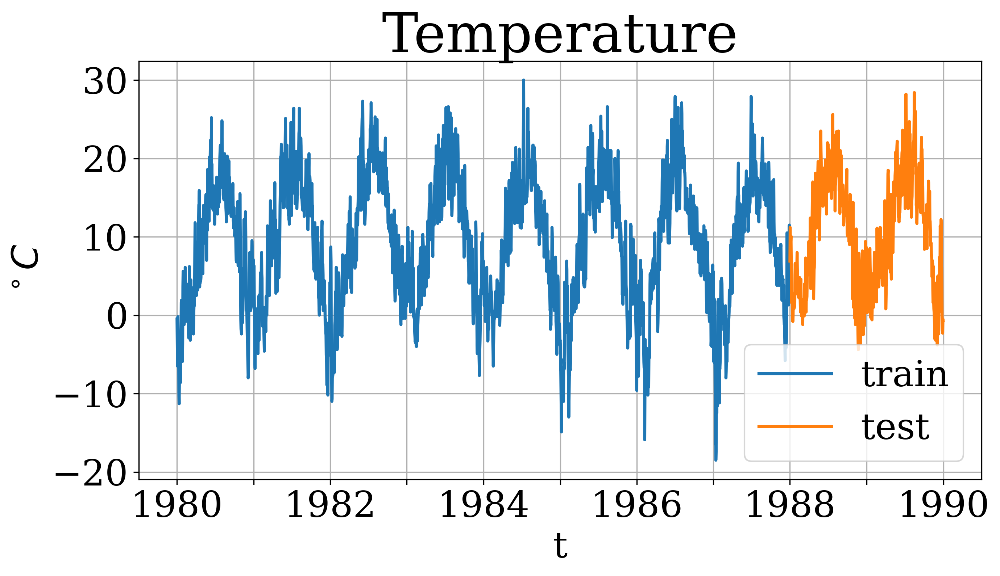

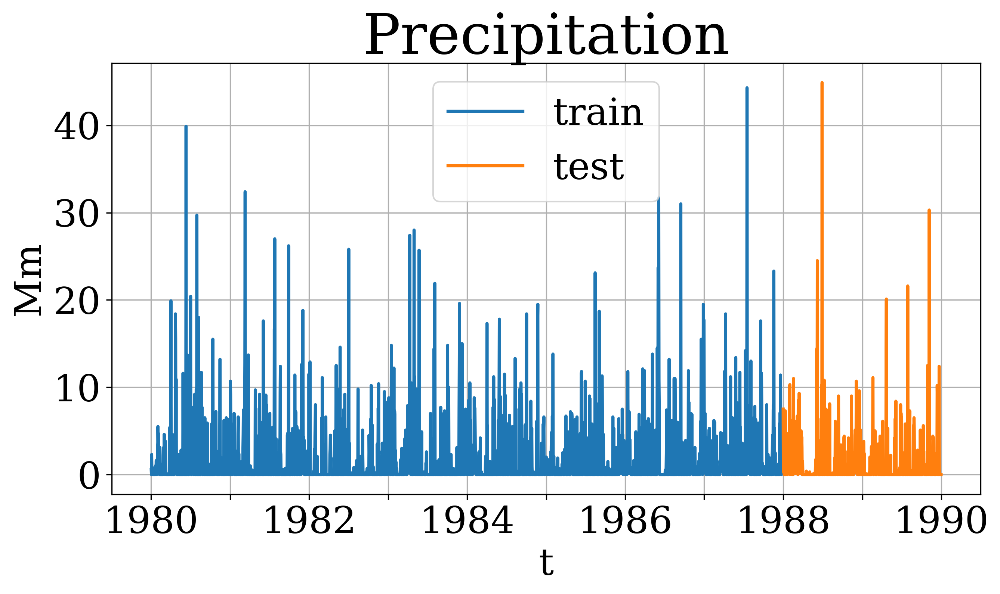

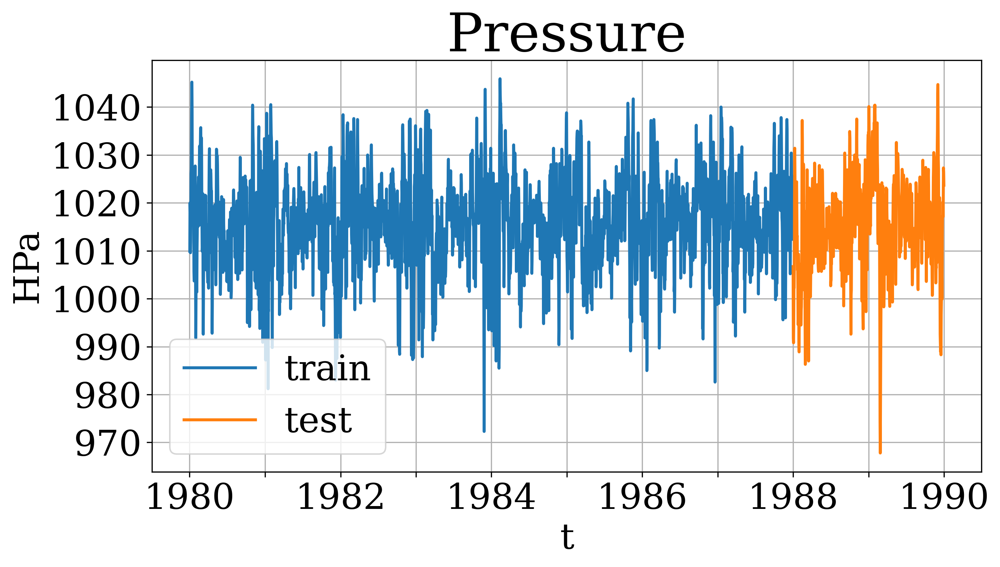

In [22]:
# draw signals
for i in range(num_signals):
    with EnableJournalStylePlotting():
        fig, ax = plt.subplots(figsize=(10, 5))

        ax.plot(time_grid_train, train_data.T[i], label='train')
        ax.plot(time_grid_test, test_data.T[i], label='test')

        ax.grid(True)
        ax.legend()
        ax.set_xlabel('t')
        ax.set_ylabel(sig_units[i])
        ax.set_title(sig_names[i])

        for index, label in enumerate(ax.xaxis.get_ticklabels()):
            if index % 2 == 0:
                label.set_visible(False)

        fig.savefig(f"/home/cyrill/Sem8/Scientific_Work/figs/{sig_names[i]}.png", format='png')

## Global method parameters

In [23]:
# aka L parameter
ssa_window_size = 500

cpd_ranks = np.arange(5, 30 + 1, 5)
# container for RHE metrics
RHE_results = {}

group_results = {}

# cut the size of the ILS system
max_col_size = 500

In [24]:
# colours for our signals (https://colorhunt.co/palette/7f27ff9f70fdfdbf60ff8911)
color_list = ['#7F27FF', '#FF8911', '#337357', '#EE4266']

CPD-rank = 5
Signal 0
solve time 3.106273889541626
status: optimal
optimal value 1764.1185166215082
optimal beta [1. 1. 1. 1.]
Signal 1
solve time 2.5062127113342285
status: optimal
optimal value 21.619200674923224
optimal beta [1. 1. 1. 1.]
Signal 2
solve time 1.8755223751068115
status: optimal
optimal value 169.78896844593237
optimal beta [0. 0. 1. 1.]
RHE for Temperature: [0.58501466 0.56002883]; Mean_ts_RHE = 0.5725217450819182
RHE for Precipitation: [0.96471628 0.56002913]; Mean_ts_RHE = 0.7623727078008894
RHE for Pressure: [0.01457538 0.56051556]; Mean_ts_RHE = 0.2875454712614832
Mean RHE for data = 0.5408133080480969


CPD-rank = 10
Signal 0
solve time 9.297275304794312
status: optimal
optimal value 11967.067352844346
optimal beta [1. 0. 0. 0. 0. 1. 1. 0. 0.]
Signal 1
solve time 15.326804876327515
status: optimal
optimal value 119.52208802483302
optimal beta [1. 0. 0. 0. 0. 1. 1. 0. 0.]
Signal 2
solve time 5.616904973983765
status: optimal
optimal value 1189.704128878143
optimal

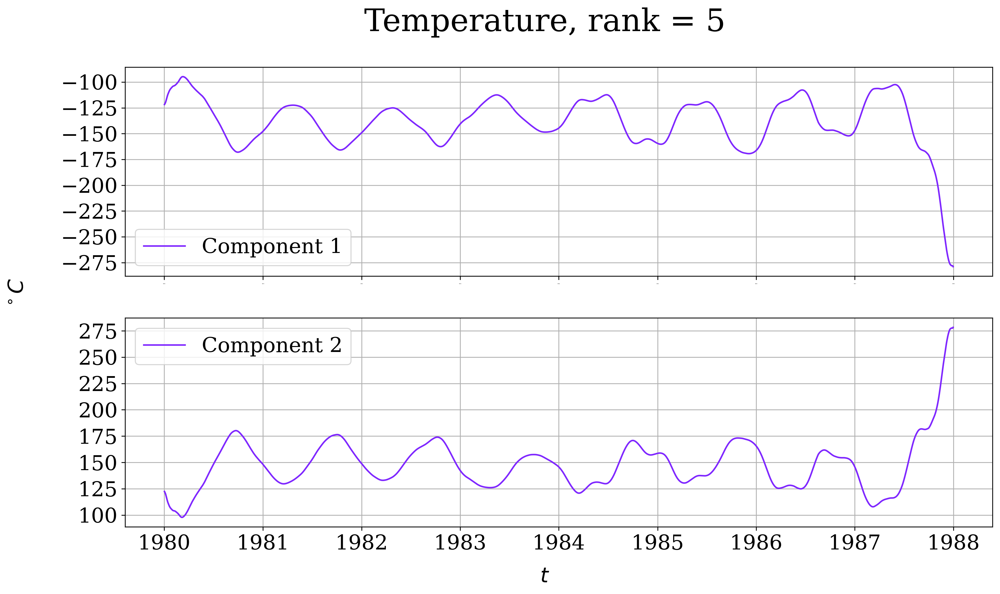

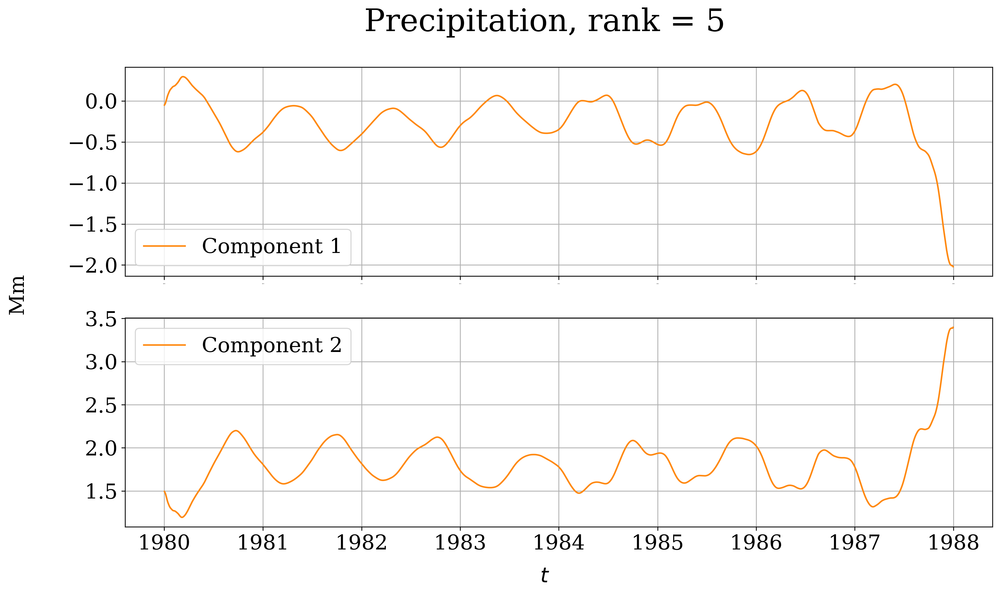

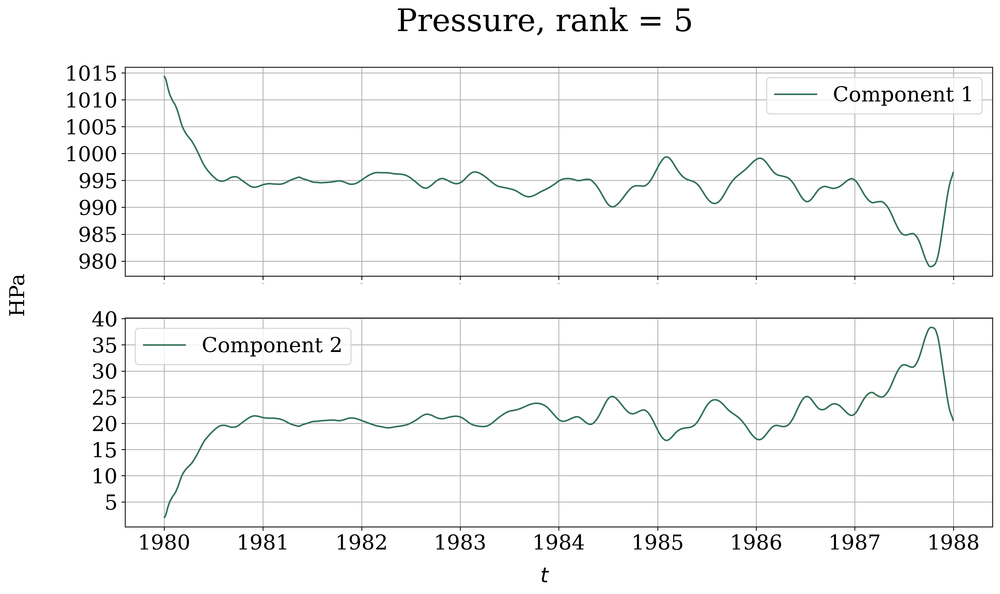

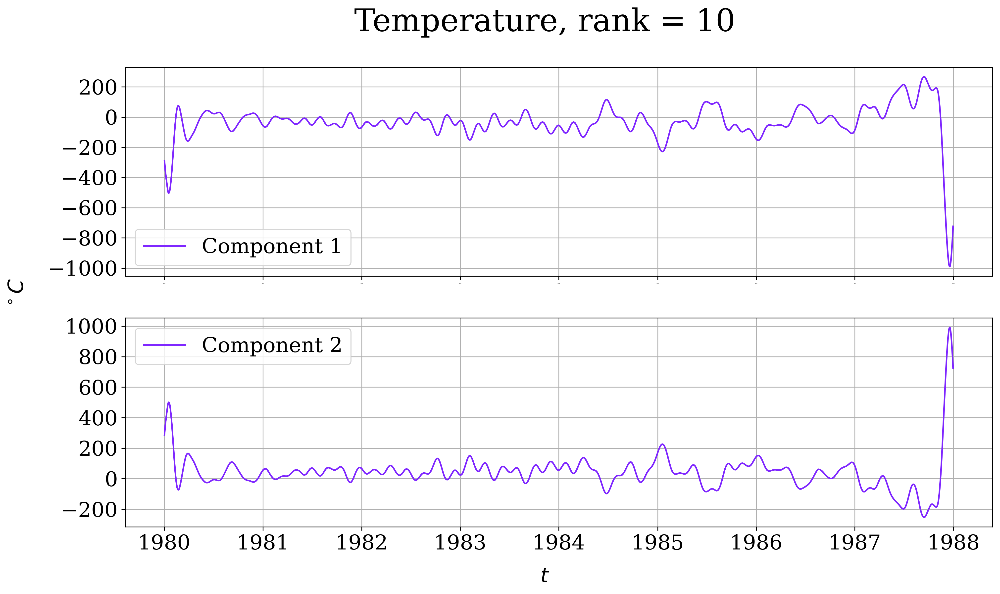

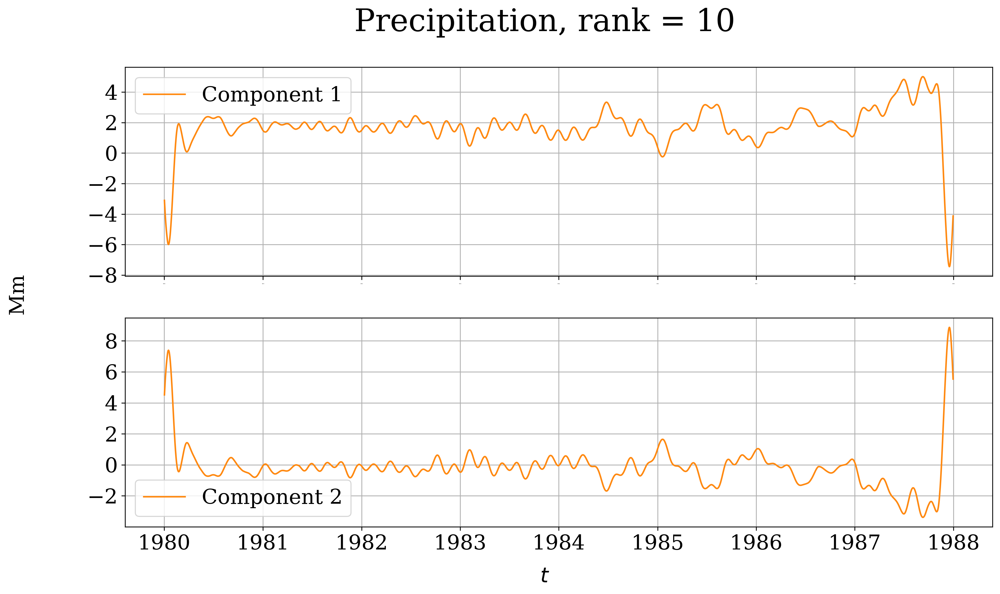

...

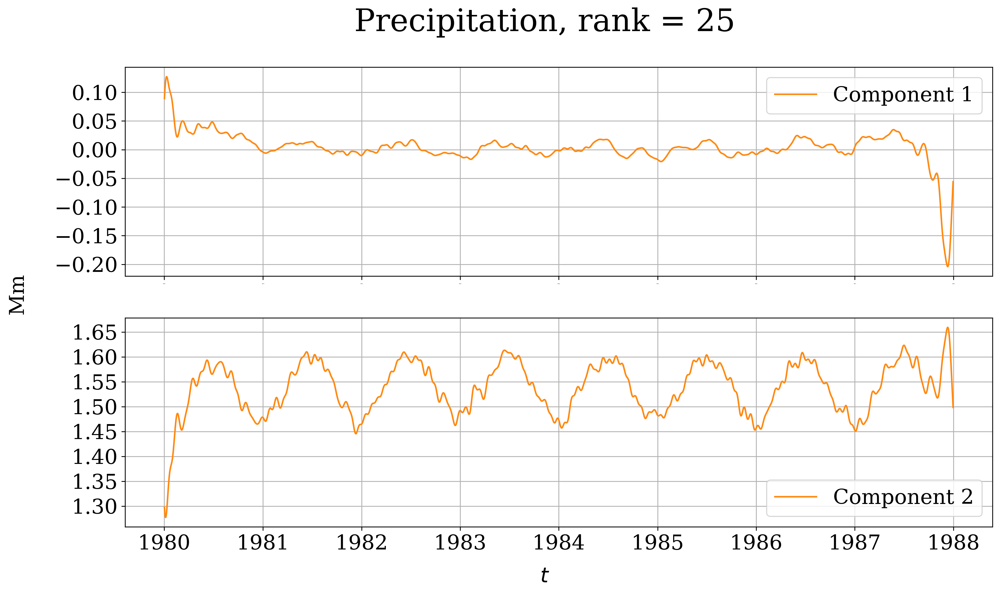

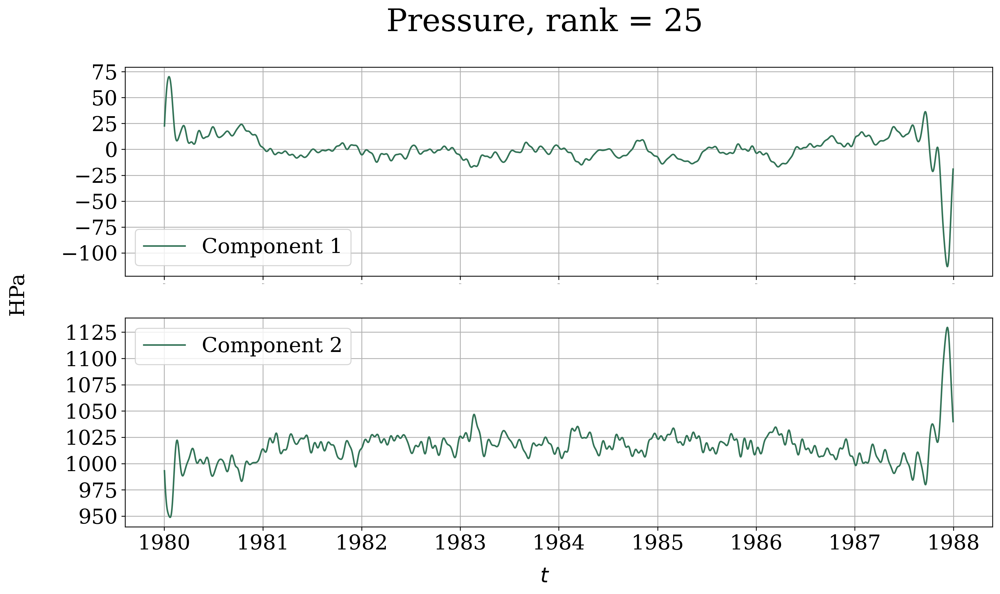

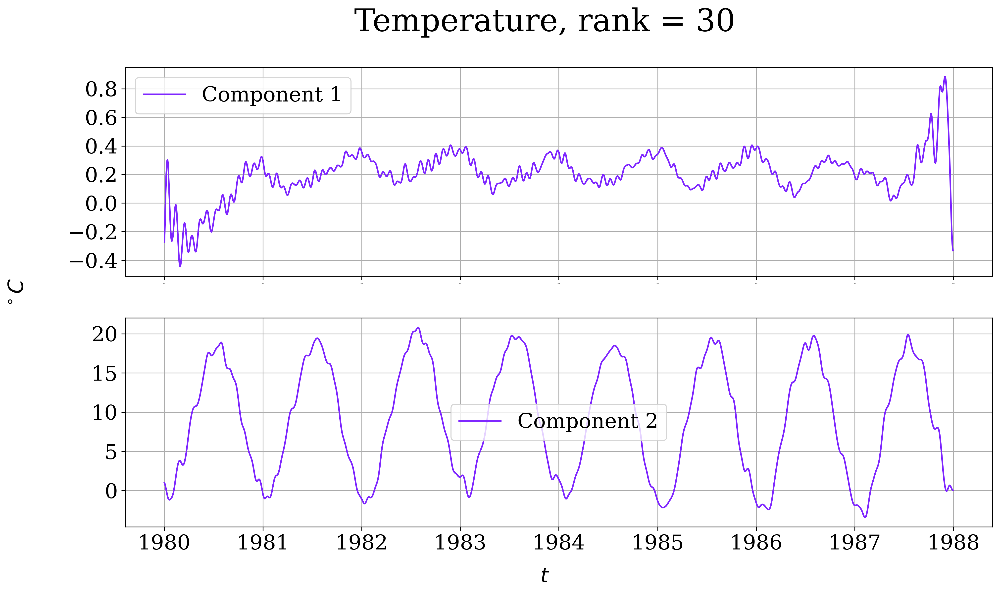

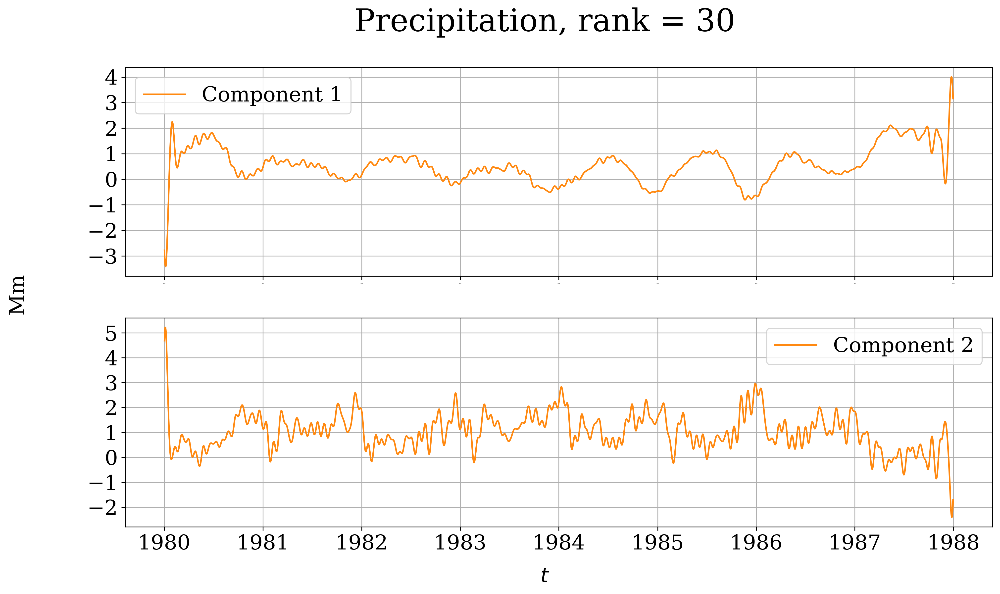

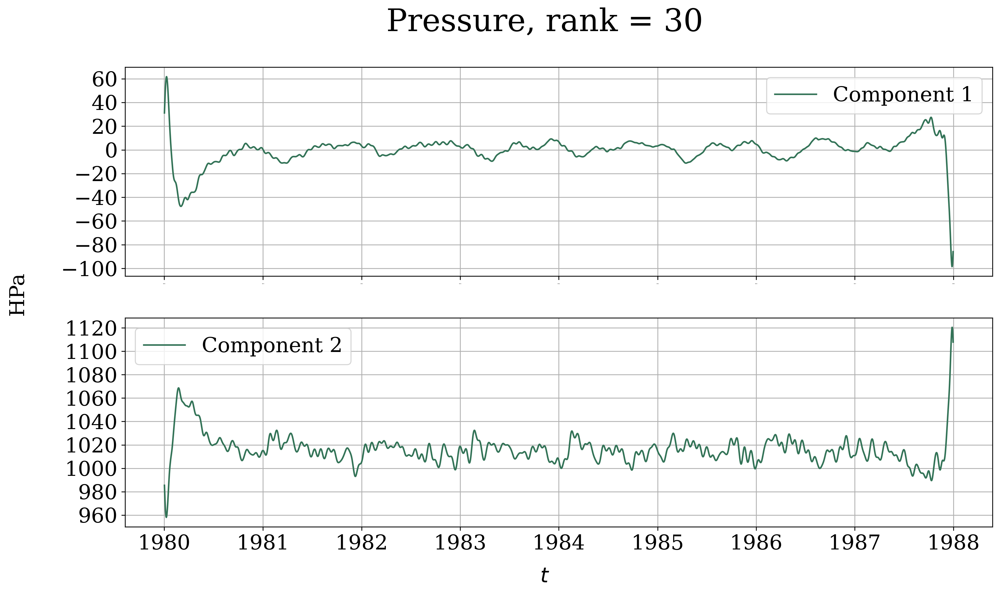

In [10]:
for cpd_rank in cpd_ranks:
    print(f"CPD-rank = {cpd_rank}")

    with open(f'./saved_model/cpd_rank_{cpd_rank}.pkl', 'rb') as f:
        t_ssa_obj: t_SSA = pickle.load(f)

    group_results[cpd_rank] = []

    num_signals = len(t_ssa_obj.t_s_list)
    for sig_num in range(num_signals):
        print(f"Signal {sig_num}")

        column_list = []

        weights, left_factors, right_factors = t_ssa_obj.get_available_factors(sig_num)

        # construct ILS system
        # get all factors except last
        for i in range(weights.shape[0] - 1):
            # compute residual matrix and cut its size
            factor_matrix = weights[i] * np.outer(left_factors[:, i], right_factors[i, :])
            hankelized_factor = factor_matrix.copy(); t_ssa_obj._hankelize_matrix(hankelized_factor)
            resid_matrix = factor_matrix - hankelized_factor

            column_list.append(
                resid_matrix.reshape(-1, 1)[:max_col_size]
            )

        ils_matrix = np.concatenate(column_list, axis=1)

        # CVXPY problem statement
        beta = cv.Variable(ils_matrix.shape[1], boolean=True)
        constraint = [cv.sum(beta) >= 2]
        obj = cv.Minimize(cv.norm(ils_matrix @ beta))
        problem = cv.Problem(obj, constraint)

        solve_time = time()
        problem.solve(solver="SCIP")
        solve_time = time() - solve_time

        print("solve time", solve_time)
        print("status:", problem.status)
        print("optimal value", problem.value)
        print("optimal beta", np.round(beta.value))

        # setting factors
        beta.value = np.round(beta.value).astype(np.int32)
        group_1 = np.argwhere(beta.value).flatten().tolist()
        group_2 = list(set(range(cpd_rank)) - set(group_1))

        group_results[cpd_rank].append([group_1, group_2])

        t_ssa_obj.set_factors_grouping([group_1, group_2], sig_num)

    # compute decomposition
    comp_sigs, hank_resid_abs, hank_resid_rel = t_ssa_obj.decompose_signals()

    RHE_results.update({
        cpd_rank: hank_resid_rel
    })

    # view and save relative hankerlization errors
    for i in range(train_data.shape[1]):
        print(f'RHE for {sig_names[i]}: {hank_resid_rel[i]}; Mean_ts_RHE = {np.mean(hank_resid_rel[i])}')
    print(f"Mean RHE for data = {np.mean(np.array(RHE_results[cpd_rank]))}")

    # plot results
    for i in range(train_data.shape[1]):
        with EnableJournalStylePlotting():
            fig, axs = plt.subplots(nrows=len(comp_sigs[i]), ncols=1, figsize=(15, 8))
    
            for j in range(len(comp_sigs[i])):
                axs[j].plot(time_grid_train, comp_sigs[i][j], label=f'Component {j + 1}', color=color_list[i])
    
                if j != len(comp_sigs[i]) - 1:
                    axs[j].tick_params(axis='x', labelsize=0)
    
                axs[j].grid(True)
                axs[j].legend()
    
            fig.supylabel(f'{sig_units[i]}', fontsize=20)
            fig.supxlabel('$t$', fontsize=20)
            fig.suptitle(f'{sig_names[i]}, rank = {cpd_rank}', fontsize=30)

    print("\n")

In [13]:
with open(f"./saved_model/group_results", "wb") as f:
    pickle.dump(group_results, f)

with open(f"./saved_model/rhe_results", "wb") as f:
    pickle.dump(RHE_results, f)

In [26]:
# restore
with open(f"./saved_model/group_results", "rb") as f:
    group_results = pickle.load(f)

with open(f"./saved_model/rhe_results", "rb") as f:
    RHE_results = pickle.load(f)

In [27]:
print(RHE_results[20])
print(list(map(np.mean, RHE_results[20])))

[array([0.0602555 , 0.97725117]), array([0.03813355, 0.97725026]), array([0.09849419, 0.98541707])]
[0.5187533340330182, 0.5076919016900674, 0.5419556270181921]


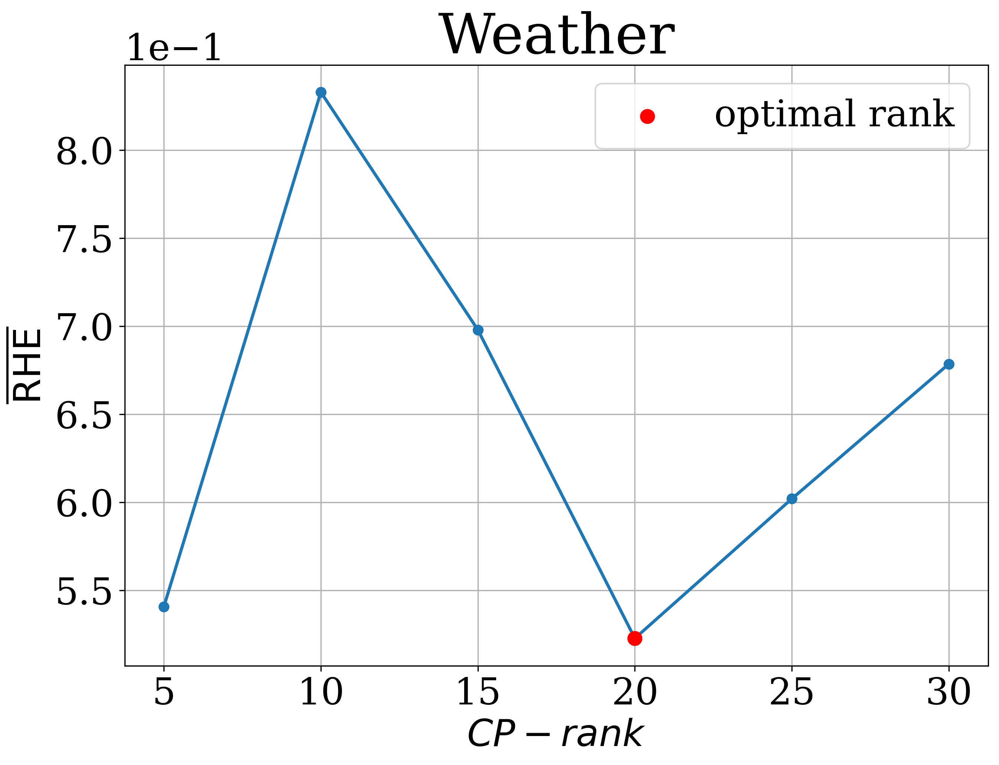

In [28]:
# plot mean RHE

rhe_means = []
for key, value in RHE_results.items():
    rhe_means.append(
        np.mean(np.array(value))
    )

with EnableJournalStylePlotting():
    fig, ax = plt.subplots(figsize=(10, 7))

    ax.plot(cpd_ranks, rhe_means, marker=".")
    ax.scatter([20], [rhe_means[3]], marker=".", s=300, c="red", label="optimal rank", zorder=10)
    
    ax.legend()
    ax.grid(True)
    ax.set_ylabel(r"$ \overline{\text{RHE}} $")
    ax.set_xlabel('$CP-rank$')
    ax.set_title("Weather")

    ax.set_xticks(cpd_ranks)
    ax.ticklabel_format(axis="y", style="scientific", scilimits=(0, 0))

    fig.savefig("./figs/decomposition/RHE_mean.png", format="png")

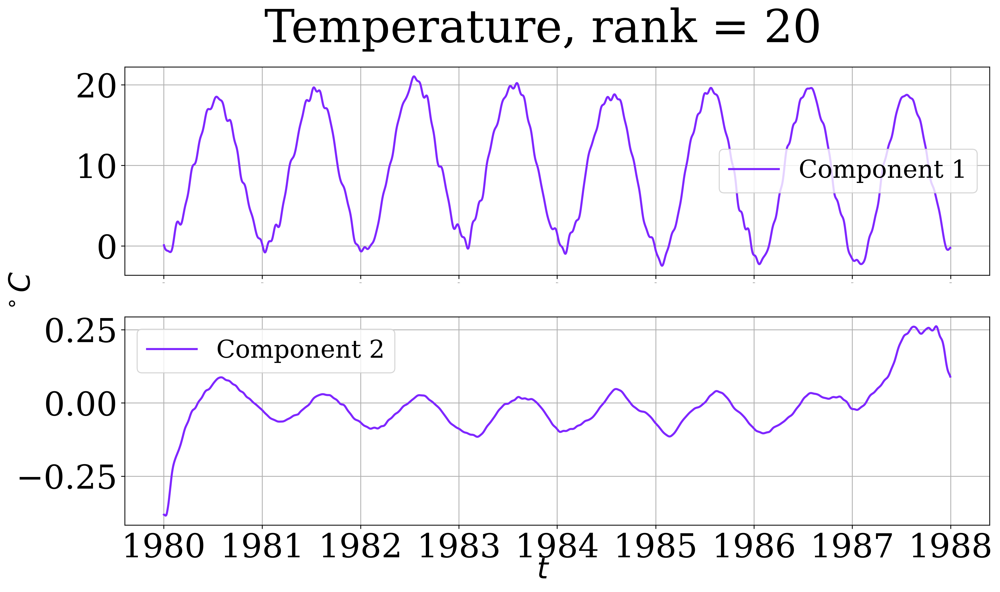

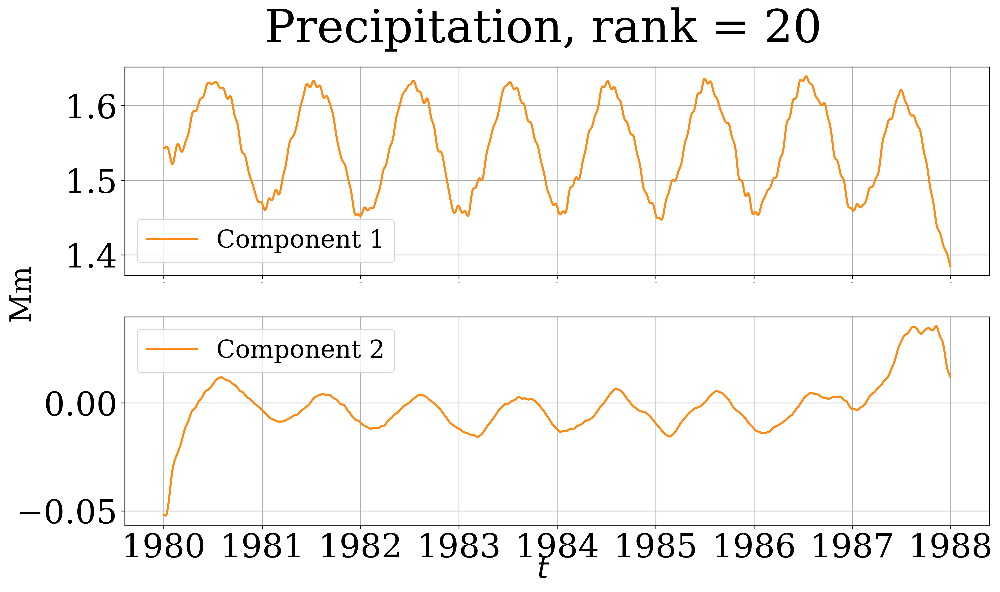

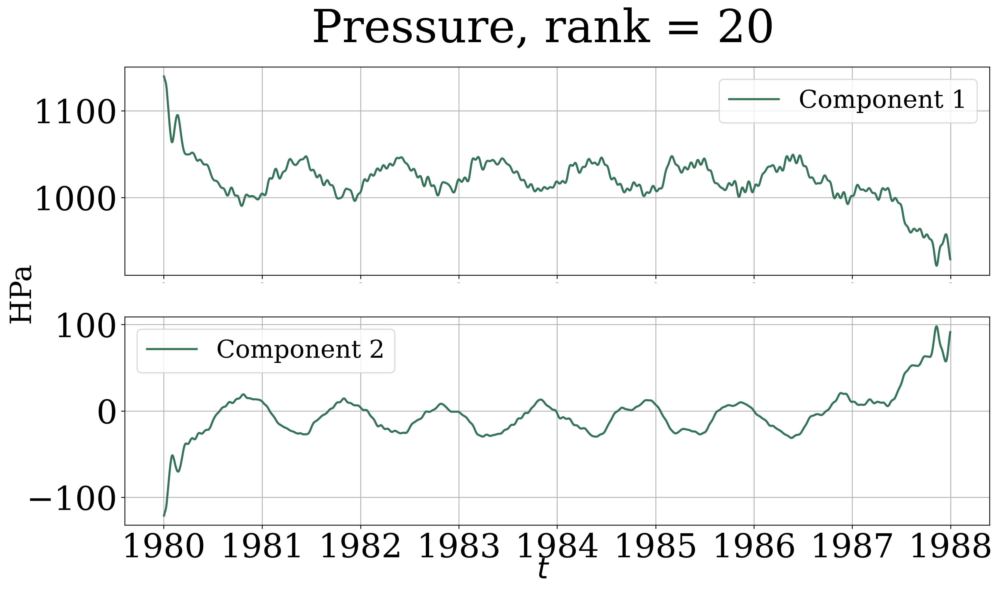

In [30]:
# restore results

with open(f'./saved_model/cpd_rank_20.pkl', 'rb') as f:
    t_ssa_obj: t_SSA = pickle.load(f)

num_signals = len(t_ssa_obj.t_s_list)
for sig_num in range(num_signals):
    t_ssa_obj.set_factors_grouping(group_results[20][sig_num], sig_num)

# compute decomposition
comp_sigs, hank_resid_abs, hank_resid_rel = t_ssa_obj.decompose_signals()

pathlib.Path("./figs/decomposition/cpd_rank_20/").mkdir(exist_ok=True)
# plot results
for i in range(train_data.shape[1]):
    with EnableJournalStylePlotting():
        fig, axs = plt.subplots(nrows=len(comp_sigs[i]), ncols=1, figsize=(15, 8))

        for j in range(len(comp_sigs[i])):
            axs[j].plot(time_grid_train, comp_sigs[i][j], label=f'Component {j + 1}', color=color_list[i])

            axs[j].tick_params(axis='y', labelsize=32, )
            if j != len(comp_sigs[i]) - 1:
                axs[j].tick_params(axis='x', labelsize=0)
            else:
                axs[j].tick_params(axis='x', labelsize=32)

            #if i == 0:
            #    axs[j].ticklabel_format(axis="y", style="scientific", scilimits=(0, 0))

            axs[j].grid(True)
            axs[j].legend()

        fig.supylabel(f'{sig_units[i]}', fontsize=28)
        fig.supxlabel('$t$', fontsize=28)
        fig.suptitle(f'{sig_names[i]}, rank = 20', fontsize=44)

        fig.savefig(f"./figs/decomposition/cpd_rank_20/{sig_names[i]}.png", format="png")